In [1]:
import pandas as pd
from IPython.display import Image #type: ignore
import requests
from bs4 import BeautifulSoup
import numpy as np

import warnings
warnings.filterwarnings('ignore')

/Users/marcelocardoso/Documents/.venv/lib/python3.9/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
display(Image(url="Data/Tech_challenge_4.png", width=800, height=500))


	Preço por barril do petróleo bruto Brent (FOB)
Frequência: Diária de 04/01/1986 até 11/12/2023
Fonte: Energy Information Administration (EIA)
Unidade: US$
Comentário: Preço por barril do petróleo bruto tipo Brent. Produzido no Mar do Norte (Europa), Brent é uma classe de petróleo bruto que serve como benchmark para o preço internacional de diferentes tipos de petróleo. Neste caso, é valorado no chamado preço FOB (free on board), que não inclui despesa de frete e seguro no preço. Mais informações: https://www.eia.gov/dnav/pet/TblDefs/pet_pri_spt_tbldef2.asp
Atualizado em: 15/12/2023


- Obter dados e armazenar em .parquet

In [3]:
def extrair_dados_e_salvar_parquet(nome_do_arquivo='dados.parquet'):
    response = requests.get("http://www.ipeadata.gov.br/ExibeSerie.aspx?module=m&serid=1650971490&oper=view")
    html_content = response.content
    soup = BeautifulSoup(html_content, 'html.parser')
    elementos_center = soup.find('body').find('form').find_all('center') # type: ignore
    segundo_center = elementos_center[1]
    linhas = segundo_center.find_all('tr')

    datas = []
    precos = []

    for linha in linhas[1:]:
        celulas = linha.find_all('td')

        if len(celulas) >= 2:
            data = celulas[0].get_text(strip=True)
            preco = celulas[1].get_text(strip=True)

            datas.append(data)
            precos.append(preco)

    df = pd.DataFrame({'Data': datas, 'Preco': precos})
    df = df.iloc[3:]
    df = df.iloc[:-2]
    df.to_parquet(nome_do_arquivo, index=False)

    return df

In [4]:
df = extrair_dados_e_salvar_parquet()
df.to_parquet('dados.parquet', index=False)

- Carregar dados

In [5]:
dados = pd.read_parquet('dados.parquet')
dados

,Data,Preco
0,26/12/2023,"80,23"
1,22/12/2023,"80,23"
2,21/12/2023,"80,73"
3,20/12/2023,"81,10"
4,19/12/2023,"79,82"
...,...,...
11069,26/05/1987,"18,63"
11070,25/05/1987,"18,60"
11071,22/05/1987,"18,55"
11072,21/05/1987,"18,45"


- Falta de dados

In [6]:
dados.isnull().sum()

Data     0
Preco    0
dtype: int64

- Verificar Tipos

In [7]:
dados.dtypes

Data     object
Preco    object
dtype: object

In [8]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11074 entries, 0 to 11073
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Data    11074 non-null  object
 1   Preco   11074 non-null  object
dtypes: object(2)
memory usage: 173.2+ KB


- Renomear Colunas e Index

In [9]:
dados = dados.rename(columns={'Data': 'Data', 'Preco': 'y'})
dados = dados.set_index('Data')
dados.head()

,y
Data,
26/12/2023,"80,23"
22/12/2023,"80,23"
21/12/2023,"80,73"
20/12/2023,"81,10"
19/12/2023,"79,82"


In [10]:
dados['y'] = dados['y'].str.replace(',', '.').astype('float64')
dados.index = pd.to_datetime(dados.index)
dados.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11074 entries, 2023-12-26 to 1987-05-20
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   y       11074 non-null  float64
dtypes: float64(1)
memory usage: 173.0 KB


- Analisar a sequencia de datas

In [11]:
dados.tail(15)

,y
Data,
1987-06-09,18.78
1987-06-08,18.75
1987-06-05,18.65
1987-06-04,18.78
1987-06-03,18.75
1987-06-02,18.68
1987-06-01,18.65
1987-05-29,18.58
1987-05-28,18.60


- Notamos que faltam as datas de sábado e domingo

- Tratamento de datas faltantes: preencher sábados e domingos com média móvel da semana

- Range de Datas

In [12]:
print("Data mais antiga:", dados.index.min())
print("Data mais recente:", dados.index.max())

Data mais antiga: 1987-05-20 00:00:00
Data mais recente: 2023-12-26 00:00:00


In [13]:
date_range = pd.date_range(start=dados.index.min(), end=dados.index.max(), freq='D')
dados = dados.reindex(date_range)
rolling_mean = dados['y'].rolling(window=6, min_periods=1).mean()
is_null_sequence = dados['y'].isnull()
dados['y'] = np.where(is_null_sequence, rolling_mean, dados['y'])
dados['y'] = dados['y'].round(2)
dados = dados.rename_axis('Data')

In [14]:
dados.head(15)

,y
Data,
1987-05-20,18.63
1987-05-21,18.45
1987-05-22,18.55
1987-05-23,18.54
1987-05-24,18.54
1987-05-25,18.60
1987-05-26,18.63
1987-05-27,18.60
1987-05-28,18.60


- Verificar nulos ou vazios após gerar os dados novos

In [15]:
dados.isnull().sum()

y    1
dtype: int64

In [16]:
valores_nulos = dados.loc[dados['y'].isnull()]
valores_nulos

,y
Data,
2023-11-05,NaN


- Temos um nulo após gerar os dados e vamos rodar novamente o preenchimento dos dados faltantes

In [17]:
def fill_nulls_rolling_mean(dados, index='Data', column_ds='ds', column_y='y', window_size=6):
    date_range = pd.date_range(start=dados.index.min(), end=dados.index.max(), freq='D')
    dados = dados.reindex(date_range)
    rolling_mean = dados[column_y].rolling(window=window_size, min_periods=1).mean()
    is_null_sequence = dados[column_y].isnull()
    dados[column_y] = np.where(is_null_sequence, rolling_mean, dados[column_y])
    dados[column_y] = dados[column_y].round(2)
    dados[column_ds] = dados.index
    dados.index.name = index

    return dados

In [18]:
dados = fill_nulls_rolling_mean(dados)

In [19]:
dados.isnull().sum()

y     0
ds    0
dtype: int64

- Visualizar o comportamento dos dados

In [20]:
import plotly.graph_objects as go

def plot_ts(df):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df.index, y=df['y'], mode='lines', line=dict(color='blue')))
    
    fig.update_layout(
        title='Variações do preço por barril do petróleo bruto tipo Brent',
        xaxis=dict(title='Data'),
        yaxis=dict(title='Valor'),
        showlegend=False,
        width=1300,
        height=600
    )

    return fig

In [21]:
fig = plot_ts(dados)
fig.show()

- Realizar decomposição da Série Temporal

In [22]:
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go
from statsmodels.tsa.seasonal import seasonal_decompose

def decompose(df, title):
    resultados = seasonal_decompose(df['y'], model='additive', period=365, two_sided=True, extrapolate_trend=5)
    fig_observed = px.line(resultados.observed, x=resultados.observed.index, y='y', title='Série Observada')
    fig_observed.update_xaxes(title_text='Data')
    fig_trend = px.line(resultados.trend, x=resultados.trend.index, y='trend', title='Componente de Tendência')
    fig_trend.update_xaxes(title_text='Data')
    fig_seasonal = px.line(resultados.seasonal, x=resultados.seasonal.index, y='seasonal', title='Componente de Sazonalidade')
    fig_seasonal.update_xaxes(title_text='Data')
    fig_resid = px.line(resultados.resid, x=resultados.resid.index, y='resid', title='Resíduo')
    fig_resid.update_xaxes(title_text='Data')
    fig = sp.make_subplots(
        rows=4,
        cols=1,
        shared_xaxes=True,
        vertical_spacing=0.1, 
        subplot_titles=[
            'Série Observada',
            'Componente de Tendência',
            'Componente de Sazonalidade',
            'Resíduo']
    )
    fig.add_trace(go.Scatter(x=fig_observed.data[0]['x'], y=fig_observed.data[0]['y'], showlegend=False), row=1, col=1) # type: ignore
    fig.add_trace(go.Scatter(x=fig_trend.data[0]['x'], y=fig_trend.data[0]['y'], showlegend=False), row=2, col=1) # type: ignore
    fig.add_trace(go.Scatter(x=fig_seasonal.data[0]['x'], y=fig_seasonal.data[0]['y'], showlegend=False), row=3, col=1) # type: ignore
    fig.add_trace(go.Scatter(x=fig_resid.data[0]['x'], y=fig_resid.data[0]['y'], showlegend=False), row=4, col=1) # type: ignore
    fig.update_xaxes(title_text='Data', row=4, col=1)
    fig.update_layout(title=title, font=dict(size=12))
    fig.update_layout(
        width=1300,
        height=600
    )
    return fig

In [23]:
fig = decompose(dados, 'Decomposição da Série Temporal - Preço do Barril')
fig.show()

#### Teste Augmented Dickey Fuller

> Hipótese
---
- H0 - Hipótese Nula (não é estacionária) não é estacionaria
- H1 - Hipótese Alternativa (rejeição da hipótese nula) é estacionaria

In [24]:
from statsmodels.tsa.stattools import adfuller, acf, pacf

def test_adfuller(df):
    result = adfuller(df.values)
    print('Teste ADf')
    print(f'Teste estatistico: {result[0]}')
    print(f'P-Value: {result[1]}')
    print(f'Valores criticos:')

    for key, value in result[4].items(): #type: ignore
        print(f'\t{key}: {value}')

In [25]:
test_adfuller(dados['y'])

Teste ADf
Teste estatistico: -2.031421865375872
P-Value: 0.27296787204885375
Valores criticos:
	1%: -3.4308407014634548
	5%: -2.861756866822613
	10%: -2.5668854333215916


> Resultado
---
- p-value 27% e teste estatístico maior que os valores criticos: Não é estacionaria

Converter séries y(Preço do Barril) em estacionarias

- Remover tendencia e sazonalidade, fazer a aproximação(transformada logaritmo e subtrair da média móvel)
- média móvel aplicada a linha da tendencia
- uma janela móvel de tamanho 12 meses é aplicada sobre os dados
- aplicar log
- subtrair a média móvel
- derivadas de um número de polinômio de primeiro grau deixando mais estacionaria.

In [26]:
def make_stationary(data, window_size=12):
    data_log = np.log(data)
    data_log_mean = data_log.rolling(window=window_size).mean()
    data_detrended = (data_log - data_log_mean).dropna()
    data_stationary = data_detrended.diff(1).dropna()

    data_stationary_diff = data_stationary['y']
    data_stationary_mean = data_stationary_diff.rolling(window=window_size).mean()
    data_stationary_std = data_stationary_diff.rolling(window=window_size).std()

    return data_stationary_diff, data_stationary_mean, data_stationary_std

In [27]:
import numpy as np
import pandas as pd
from scipy.stats import boxcox

def make_stationary_boxcox(data, window_size=12):
    data_boxcox, lambda_value = boxcox(data['y']) #type:ignore

    data_transformed = data.copy()
    data_transformed['y'] = data_boxcox

    data_diff = data_transformed['y'].diff(1).dropna()
    data_mean = data_diff.rolling(window=window_size).mean()
    data_std = data_diff.rolling(window=window_size).std()

    return data_diff, data_mean, data_std, lambda_value

In [28]:
dados1 = dados
dados, dados_mean, dados_std = make_stationary(dados[['y']])
dados_diff, data_mean, data_std, lambda_value = make_stationary_boxcox(dados1)

- Resultado da transformação

In [29]:
def data_diff(dados, dados_mean, dados_std):
    trace_diff = go.Scatter(x=dados.index, y=dados, mode='lines', name='Variação')
    trace_mean = go.Scatter(x=dados_mean.index, y=dados_mean, mode='lines', name='Média', line=dict(color='red'))
    trace_std = go.Scatter(x=dados_std.index, y=dados_std, mode='lines', name='Desvio Padrão', line=dict(color='green'))
    fig = go.Figure(data=[trace_diff, trace_mean, trace_std])
    fig.update_xaxes(title_text='Data')
    fig.update_yaxes(title_text='Preço do Barril')
    fig.update_layout(title='Variação, Média e Desvio Padrão do Preço do Barril', showlegend=True)
    
    return fig

In [30]:
data_diff(dados, dados_mean, dados_std)

In [31]:
data_diff(dados_diff, data_mean, data_std)

- Refazer o Teste ADF

In [32]:
def test_diff_adfuller(df):
    result = adfuller(df)
    print('Teste ADf')
    print(f'Teste estatistico: {result[0]}')
    print(f'P-Value: {result[1]}')
    print(f'Valores criticos:')
    for key, value in result[4].items(): #type: ignore
        print(f'\t{key}: {value}')

In [33]:
test_diff_adfuller(dados)

Teste ADf
Teste estatistico: -28.21130938551205
P-Value: 0.0
Valores criticos:
	1%: -3.4308411437217097
	5%: -2.861757062263667
	10%: -2.5668855373532624


> Resultado
---
p-value 0.0% e teste estatístico menor que os valores criticos: É estacionaria

 - Fazer a autocorrelação dos dados convertidos

##### Autocorrelação (ACF) e função de Autocorrelação Parcial (PACF)
---
- 5% ACF -> (intervalo de confiança).
- 1.96/sqrt(N-d) -> **N** número de pontos e **d** é o número de vezes que os dados foram diferenciamos (intervalo de confiança para estimativas de autocorrelação significativa).

In [34]:
def autocorrelation_function(df, lag):
    return acf(df.dropna(), nlags=lag)

def partial_autocorrelation_function(df, lag):
    return pacf(df.dropna(), nlags=lag)

def acf_pacf(dados):
    fig = sp.make_subplots(rows=1, cols=2, subplot_titles=['ACF - Preço do Barril', 'PACF - Preço do Barril'])
    trace_acf = go.Scatter(x=np.arange(len(autocorrelation_function(dados, 14))),
                        y=autocorrelation_function(dados, 14),
                        mode='lines',
                        name='ACF')
    trace_pacf = go.Scatter(x=np.arange(len(partial_autocorrelation_function(dados, 14))),
                            y=partial_autocorrelation_function(dados, 14),
                            mode='lines',
                            name='PACF')
    fig.add_trace(trace_acf, row=1, col=1)
    fig.add_trace(trace_pacf, row=1, col=2)
    hline = go.Scatter(x=[0, len(dados) - 1],
                    y=[-1.96 / (np.sqrt((len(dados) - 1))), -1.96 / (np.sqrt((len(dados) - 1)))],
                    mode='lines',
                    line=dict(color='gray', dash='dash'),
                    showlegend=False)
    fig.add_trace(hline, row=1, col=1)
    fig.add_trace(hline, row=1, col=2)
    hline = go.Scatter(x=[0, len(dados) - 1],
                    y=[1.96 / (np.sqrt((len(dados) - 1))), 1.96 / (np.sqrt((len(dados) - 1)))],
                    mode='lines',
                    line=dict(color='gray', dash='dash'),
                    showlegend=False)
    fig.add_trace(hline, row=1, col=1)
    fig.add_trace(hline, row=1, col=2)
    q_value = 0.85
    p_value = 0.85
    point_acf = go.Scatter(x=[q_value], y=[0.017], mode='markers', marker=dict(color='red'), name='Q')
    point_pacf = go.Scatter(x=[p_value], y=[0.017], mode='markers', marker=dict(color='red'), name='P')
    fig.add_trace(point_acf, row=1, col=1)
    fig.add_trace(point_pacf, row=1, col=2)
    fig.update_xaxes(title_text='Lag', range=[0, 15], row=1, col=1)
    fig.update_xaxes(title_text='Lag', range=[0, 15], row=1, col=2)
    fig.update_yaxes(title_text='Correlação', range=[-0.30, 0.3], row=1, col=1)
    fig.update_yaxes(title_text='Correlação', range=[-0.30, 0.3], row=1, col=2)
    fig.update_layout(title='ACF e PACF do Preço do Barril', showlegend=True)
    return fig

In [35]:
fig = acf_pacf(dados)
fig.show()

- Usamos os dados originais para plotar o ACF e PCF aqui

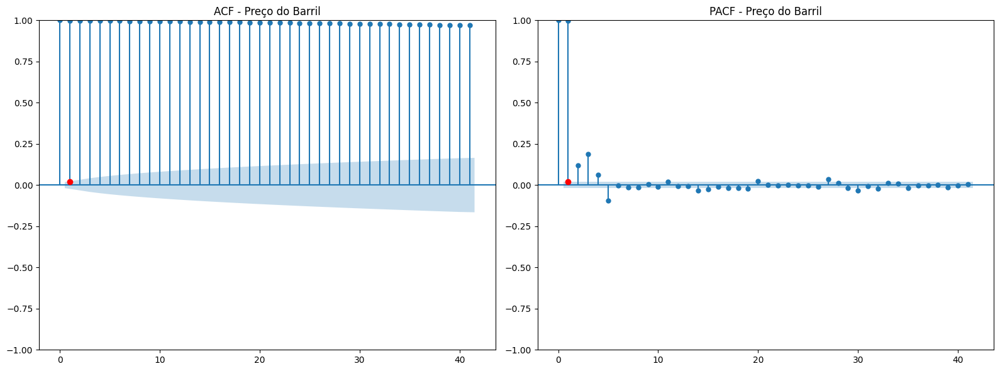

In [36]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

dados_originais = pd.read_parquet('dados.parquet')
dados_originais = dados_originais.rename(columns={'Data': 'Data', 'Preco': 'y'})
dados_originais = dados_originais.set_index('Data')
dados_originais['y'] = dados_originais['y'].str.replace(',', '.').astype('float64')
dados_originais.index = pd.to_datetime(dados_originais.index)
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
plot_acf(dados_originais, ax=ax[0])
ax[0].set_title('ACF - Preço do Barril')
ax[0].plot(1, 1.96/np.sqrt(len(dados_originais['y']) - 1), 'ro')
plot_pacf(dados_originais['y'], ax=ax[1])
ax[1].set_title('PACF - Preço do Barril')
ax[1].plot(1, 1.96/np.sqrt(len(dados_originais['y']) - 1), 'ro')
plt.tight_layout()
plt.show()

- Realismos a busca dos valores P e Q para rodar modelos que usam ARIMA

#####  ARIMA (P, D, Q)
---
- Ordem de diferenciação **D** = 1 (Foi necessária 1 diferenciação para tornar a série estacionaria)
- **Q acf** = 0.85
- **P pacf** = 0.85

- Converter a serie em dataframe

In [37]:
dados.head(15)

Data
1987-06-01    0.002595
1987-06-02    0.000575
1987-06-03    0.002847
1987-06-04    0.000527
1987-06-05   -0.007439
1987-06-06    0.002231
1987-06-07    0.000178
1987-06-08    0.001466
1987-06-09    0.000796
1987-06-10   -0.000892
1987-06-11   -0.005697
1987-06-12    0.004536
1987-06-13   -0.002044
1987-06-14    0.000177
1987-06-15   -0.000533
Freq: D, Name: y, dtype: float64

In [38]:
dados_originais.head(15)

,y
Data,
2023-12-26,80.23
2023-12-22,80.23
2023-12-21,80.73
2023-12-20,81.10
2023-12-19,79.82
2023-12-18,78.89
2023-12-15,76.84
2023-12-14,77.05
2023-12-13,74.14


In [39]:
dataset = pd.DataFrame()
dataset.index = dados.index
dataset['ds'] = dataset.index
dataset.index.name = 'Data'
dataset['y'] = dados
dataset.tail()

,ds,y
Data,,
2023-12-22,2023-12-22,-0.011343
2023-12-23,2023-12-23,-0.005703
2023-12-24,2023-12-24,-0.002877
2023-12-25,2023-12-25,-0.004325
2023-12-26,2023-12-26,-0.009087


In [40]:
dataset = pd.merge(dataset, dados_originais, left_index=True, right_index=True, how='left')
dataset.rename(columns={'y_y': 'y'}, inplace=True)
dataset

,ds,y_x,y
Data,,,
1987-06-01,1987-06-01,0.002595,18.65
1987-06-02,1987-06-02,0.000575,18.68
1987-06-03,1987-06-03,0.002847,18.75
1987-06-04,1987-06-04,0.000527,18.78
1987-06-05,1987-06-05,-0.007439,18.65
...,...,...,...
2023-12-22,2023-12-22,-0.011343,80.23
2023-12-23,2023-12-23,-0.005703,NaN
2023-12-24,2023-12-24,-0.002877,NaN


- Executar uma função for enquanto tiver nulo

In [41]:
while dataset.isnull().any().any():
    for column in dataset.columns:
        if dataset[column].isnull().any():
            dataset = fill_nulls_rolling_mean(dataset, index='Data', column_ds='ds', column_y='y')

dataset.isnull().sum()

ds     0
y_x    0
y      0
dtype: int64

- Separar dados de treino, teste e validação

In [42]:
df_train = dataset.loc[dataset.ds < '2023-11-01']
df_test = dataset.loc[(dataset.ds >= '2023-11-01') & (dataset.ds < '2023-12-01')]
df_valid = dataset.loc[dataset.ds >= '2023-12-01']

- Salvar os dados preparados

In [43]:
df_train.to_parquet('train.parquet', index=True)
df_test.to_parquet('test.parquet', index=True)
df_valid.to_parquet('valid.parquet', index=True)

In [44]:
train = pd.read_parquet('train.parquet')
test = pd.read_parquet('test.parquet')
valid = pd.read_parquet('valid.parquet')

In [45]:
h = test['ds'].nunique() #type: ignore
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13302 entries, 1987-06-01 to 2023-10-31
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      13302 non-null  datetime64[ns]
 1   y_x     13302 non-null  float64       
 2   y       13302 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 415.7 KB


In [46]:
test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30 entries, 2023-11-01 to 2023-11-30
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      30 non-null     datetime64[ns]
 1   y_x     30 non-null     float64       
 2   y       30 non-null     float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 960.0 bytes


In [47]:
valid.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26 entries, 2023-12-01 to 2023-12-26
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      26 non-null     datetime64[ns]
 1   y_x     26 non-null     float64       
 2   y       26 non-null     float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 832.0 bytes


In [48]:
train.loc[:, 'unique_id'] = 'Brent'
test.loc[:, 'unique_id'] = 'Brent'
valid.loc[:, 'unique_id']  = 'Brent'
print(f'Treino: {train.shape}')
print(f'Teste: {test.shape}')
print(f'Validação: {valid.shape}')
print(h)

Treino: (13302, 4)
Teste: (30, 4)
Validação: (26, 4)
30


In [49]:
valid.head()

,ds,y_x,y,unique_id
Data,,,,
2023-12-01,2023-12-01,-0.034622,78.72,Brent
2023-12-02,2023-12-02,0.029816,80.91,Brent
2023-12-03,2023-12-03,0.005610,81.27,Brent
2023-12-04,2023-12-04,-0.035266,78.16,Brent
2023-12-05,2023-12-05,-0.007678,77.27,Brent


- Tipos de erros utilizados para validar o quão bom esta nosso modelo

$$MAPE = \frac{1}{n} \sum_{i=1}^{n} \left| \frac{y_{\text{true},i} - y_{\text{pred},i}}{y_{\text{true},i}} \right| \times 100$$
---
$$WMAPE = \frac{\sum_{i=1}^{n} \left| y_{\text{true},i} - y_{\text{pred},i} \right|}{\sum_{i=1}^{n} \left| y_{\text{true},i} \right|} \times 100$$
---
$$SMAPE = \frac{100}{n} \sum_{i=1}^{n} \frac{\left| y_{\text{pred},i} - y_{\text{true},i} \right|}{(|y_{\text{pred},i}| + |y_{\text{true},i}|)/2}$$

- Modelos da biblioteca statsforecast

In [50]:
from statsforecast import StatsForecast
from statsforecast.models import (
    SeasonalWindowAverage,
    AutoETS,
    AutoCES,
    AutoTheta,
    SeasonalExponentialSmoothingOptimized,
    MSTL,
    DynamicOptimizedTheta
)
import joblib

In [51]:
def mape_error(y_true, y_pred):
    n = len(y_true)
    mape = (np.abs((y_true - y_pred) / y_true).sum() / n)
    print(f"MAPE (Mean Absolute Percentage Error): {mape:.2%}")
    return mape

def wmape_error(y_true, y_pred):
    wmape = np.abs(y_true - y_pred).sum() / np.abs(y_true).sum()
    print(f"WMAPE (Weighted Mean Absolute Percentage Error): {wmape:.2%}")
    return wmape

def smape_error(y_true, y_pred):
    smape = (np.abs(y_pred - y_true) * 2 / (np.abs(y_pred) + np.abs(y_true))).mean()
    print(f"SMAPE (Symmetric Mean Absolute Percentage Error): {smape:.2%}")
    return smape

WMAPE (Weighted Mean Absolute Percentage Error): 3.02%
WMAPE (Weighted Mean Absolute Percentage Error): 4.47%


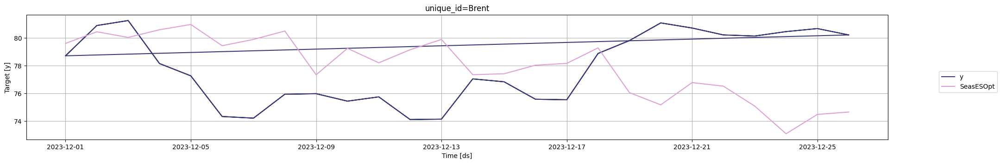

In [67]:
SeasESOpt_model = StatsForecast(models=[SeasonalExponentialSmoothingOptimized(season_length=180)], freq='D', n_jobs=-1)
SeasESOpt_model.fit(train[['ds', 'y', 'unique_id']])
SeasESOpt_forecast = SeasESOpt_model.predict(h=h)
SeasESOpt_forecast = SeasESOpt_forecast.reset_index().merge(test[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
SeasESOpt_forecast.dropna(inplace=True)

wmape = wmape_error(SeasESOpt_forecast['y'].values, SeasESOpt_forecast['SeasESOpt'].values)

SeasESOpt_model.plot(
    train[['ds', 'y', 'unique_id']],
    SeasESOpt_forecast,
    # level=[95],
    max_insample_length=90
)

SeasESOpt_forecast_valid = SeasESOpt_model.predict(h=h + 30)
SeasESOpt_forecast_valid = SeasESOpt_forecast_valid.reset_index().merge(valid[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
SeasESOpt_forecast_valid.dropna(inplace=True)

wmape = wmape_error(SeasESOpt_forecast_valid['y'].values, SeasESOpt_forecast_valid['SeasESOpt'].values)

SeasESOpt_model.plot(
    valid[['ds', 'y', 'unique_id']],
    SeasESOpt_forecast_valid,
    # level=[95],
    max_insample_length=90
)

In [68]:
with open('SeasonalExponentialSmoothingOptimized', 'wb') as output:
    joblib.dump(SeasESOpt_model, output)

WMAPE (Weighted Mean Absolute Percentage Error): 6.84%
WMAPE (Weighted Mean Absolute Percentage Error): 12.10%


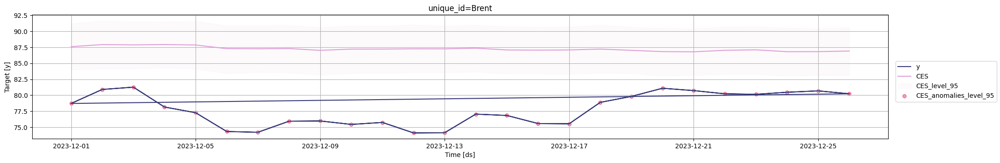

In [70]:
CES_model = StatsForecast(models=[AutoCES(model='Z', season_length=365)], freq='D', n_jobs=-1)
CES_model.fit(train[['ds', 'y', 'unique_id']])
CES_forecast = CES_model.predict(h=h, level=[95])
CES_forecast = CES_forecast.reset_index().merge(test[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
CES_forecast.dropna(inplace=True)

wmape = wmape_error(CES_forecast['y'].values, CES_forecast['CES'].values)

CES_model.plot(
    train[['ds', 'y', 'unique_id']],
    CES_forecast,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

CES_forecast_valid = CES_model.predict(h=h + 30, level=[95])
CES_forecast_valid = CES_forecast_valid.reset_index().merge(valid[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
CES_forecast_valid.dropna(inplace=True)

wmape = wmape_error(CES_forecast_valid['y'].values, CES_forecast_valid['CES'].values)

CES_model.plot(
    valid[['ds', 'y', 'unique_id']],
    CES_forecast_valid,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

In [71]:
with open('AutoCES', 'wb') as output:
    joblib.dump(CES_model, output)

WMAPE (Weighted Mean Absolute Percentage Error): 6.56%
WMAPE (Weighted Mean Absolute Percentage Error): 11.06%


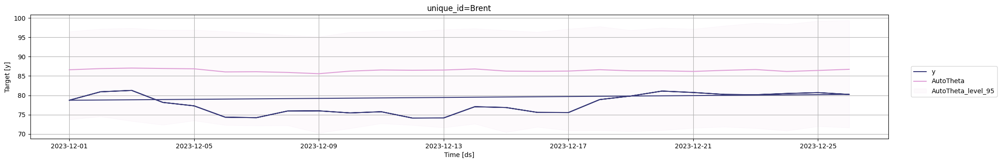

In [72]:
AutoTheta_model = StatsForecast(models=[AutoTheta(decomposition_type='multiplicative', model='DOTM', season_length=365)], freq='D', n_jobs=-1)
AutoTheta_model.fit(train[['ds', 'y', 'unique_id']])
AutoTheta_forecast = AutoTheta_model.predict(h=h, level=[95])
AutoTheta_forecast = AutoTheta_forecast.reset_index().merge(test[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
AutoTheta_forecast.dropna(inplace=True)

wmape = wmape_error(AutoTheta_forecast['y'].values, AutoTheta_forecast['AutoTheta'].values)

AutoTheta_model.plot(
    train[['ds', 'y', 'unique_id']],
    AutoTheta_forecast,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

AutoTheta_forecast_valid = AutoTheta_model.predict(h=h + 30, level=[95])
AutoTheta_forecast_valid = AutoTheta_forecast_valid.reset_index().merge(valid[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
AutoTheta_forecast_valid.dropna(inplace=True)

wmape = wmape_error(AutoTheta_forecast_valid['y'].values, AutoTheta_forecast_valid['AutoTheta'].values)

AutoTheta_model.plot(
    valid[['ds', 'y', 'unique_id']],
    AutoTheta_forecast_valid,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

In [73]:
with open('AutoTheta', 'wb') as output:
    joblib.dump(AutoTheta_model, output)

WMAPE (Weighted Mean Absolute Percentage Error): 6.56%
WMAPE (Weighted Mean Absolute Percentage Error): 11.06%


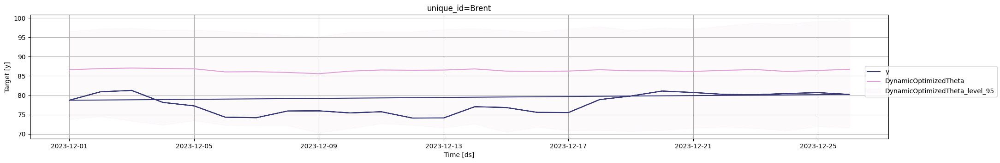

In [74]:
Dynamic_model = StatsForecast(models=[DynamicOptimizedTheta(decomposition_type='multiplicative', season_length=365)], freq='D', n_jobs=-1)
Dynamic_model.fit(train[['ds', 'y', 'unique_id']])
Dynamic_forecast = Dynamic_model.predict(h=h, level=[95])
Dynamic_forecast = Dynamic_forecast.reset_index().merge(test[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
Dynamic_forecast.dropna(inplace=True)

wmape = wmape_error(Dynamic_forecast['y'].values, Dynamic_forecast['DynamicOptimizedTheta'].values)

Dynamic_model.plot(
    train[['ds', 'y', 'unique_id']],
    Dynamic_forecast,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

Dynamic_forecast_valid = Dynamic_model.predict(h=h + 30, level=[95])
Dynamic_forecast_valid = Dynamic_forecast_valid.reset_index().merge(valid[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
Dynamic_forecast_valid.dropna(inplace=True)

wmape = wmape_error(Dynamic_forecast_valid['y'].values, Dynamic_forecast_valid['DynamicOptimizedTheta'].values)

Dynamic_model.plot(
    valid[['ds', 'y', 'unique_id']],
    Dynamic_forecast_valid,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

In [75]:
with open('DynamicOptimizedTheta', 'wb') as output:
    joblib.dump(Dynamic_model, output)

WMAPE (Weighted Mean Absolute Percentage Error): 3.15%
WMAPE (Weighted Mean Absolute Percentage Error): 2.57%


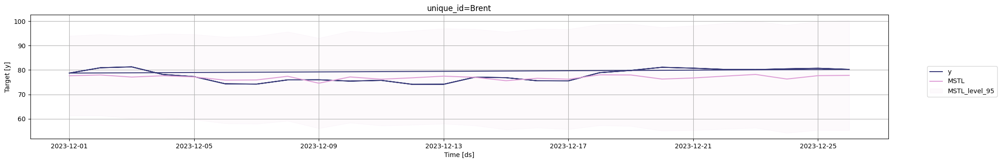

In [76]:
MSTL_model = StatsForecast([MSTL(season_length=[180, 365], trend_forecaster=AutoETS(model='ZZN'))], freq='D', n_jobs=-1)
MSTL_model.fit(train[['ds', 'y', 'unique_id']])
MSTL_forecast = MSTL_model.predict(h=h, level=[95])
MSTL_forecast = MSTL_forecast.reset_index().merge(test[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
MSTL_forecast.dropna(inplace=True)

wmape = wmape_error(MSTL_forecast['y'].values, MSTL_forecast['MSTL'].values)

MSTL_model.plot(
    train[['ds', 'y', 'unique_id']],
    MSTL_forecast,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

MSTL_forecast_valid = MSTL_model.predict(h=h + 30, level=[95])
MSTL_forecast_valid = MSTL_forecast_valid.reset_index().merge(valid[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
MSTL_forecast_valid.dropna(inplace=True)

wmape = wmape_error(MSTL_forecast_valid['y'].values, MSTL_forecast_valid['MSTL'].values)

MSTL_model.plot(
    valid[['ds', 'y', 'unique_id']],
    MSTL_forecast_valid,
    level=[95],
    max_insample_length=90,
    plot_anomalies=True
)

In [77]:
with open('MTS', 'wb') as output:
    joblib.dump(MSTL_model, output)

WMAPE (Weighted Mean Absolute Percentage Error): 9.57%
WMAPE (Weighted Mean Absolute Percentage Error): 3.01%


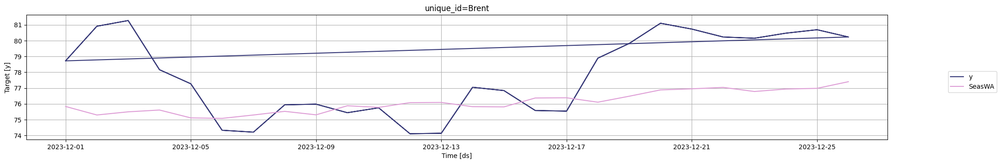

In [81]:
SeasWA_model = StatsForecast([SeasonalWindowAverage(season_length=180, window_size=30)], freq='D', n_jobs=-1)
SeasWA_model.fit(train[['ds', 'y', 'unique_id']])
SeasWA_forecast = SeasWA_model.predict(h=h)
SeasWA_forecast = SeasWA_forecast.reset_index().merge(test[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
SeasWA_forecast.dropna(inplace=True)

wmape = wmape_error(SeasWA_forecast['y'].values, SeasWA_forecast['SeasWA'].values)

SeasWA_model.plot(
    train[['ds', 'y', 'unique_id']],
    SeasWA_forecast,
    max_insample_length=90
)

SeasWA_forecast_valid = SeasWA_model.predict(h=h + 30)
SeasWA_forecast_valid = SeasWA_forecast_valid.reset_index().merge(valid[['ds', 'y', 'unique_id']], on=['ds', 'unique_id'], how='left')
SeasWA_forecast_valid.dropna(inplace=True)

wmape = wmape_error(SeasWA_forecast_valid['y'].values, SeasWA_forecast_valid['SeasWA'].values)

SeasWA_model.plot(
    valid[['ds', 'y', 'unique_id']],
    SeasWA_forecast_valid,
    max_insample_length=90
)

In [82]:
with open('SeasonalWindowAverage', 'wb') as output:
    joblib.dump(SeasWA_model, output)

- SARIMAX

In [83]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
sarima_model = SARIMAX(train[['y']], order=(1, 1, 1), seasonal_order=(0, 1, 0, 7))
sarima = sarima_model.fit(disp=False)

sarima_forecast = sarima.get_forecast(steps=h) # type: ignore
sarima_forecast_result = sarima_forecast.predicted_mean
sarima_df = pd.DataFrame({'predicted_mean': sarima_forecast_result.values}, index=test.index)

/Users/marcelocardoso/Documents/.venv/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/marcelocardoso/Documents/.venv/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



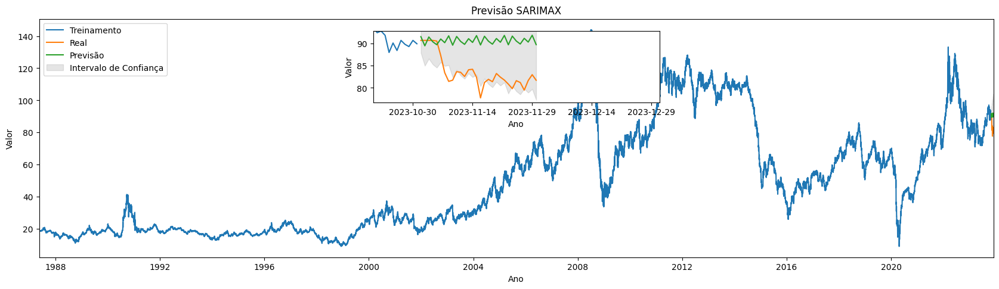

In [85]:
fig = plt.figure(figsize=(16, 4))
eixo = fig.add_axes([0, 0, 1, 1])
eixo.plot(train['y'], label='Treinamento')
eixo.plot(test.index, test['y'], label='Real')
eixo.plot(sarima_df.index, sarima_df['predicted_mean'], label='Previsão')
eixo.fill_between(
    sarima_forecast.conf_int().index,
    sarima_forecast.conf_int()['lower y'],
    sarima_forecast.conf_int()['upper y'],
    color='gray',
    alpha=0.2,
    label='Intervalo de Confiança'
)
eixo.legend()
eixo.set_title('Previsão SARIMAX')
eixo.set_xlim(pd.Timestamp('1987-05-20'), test.index[-1]) # type: ignore
eixo.set_xlabel('Ano')
eixo.set_ylabel('Valor')
eixo2 = fig.add_axes([0.35, 0.65, 0.3, 0.3])
eixo2.plot(train['y'], label='Treinamento')
eixo2.plot(test.index, test['y'], label='Real')
eixo2.plot(sarima_df.index, sarima_df['predicted_mean'], label='Previsão')
eixo2.fill_between(
    sarima_forecast.conf_int().index,
    sarima_forecast.conf_int()['lower y'],
    sarima_forecast.conf_int()['upper y'],
    color='gray',
    alpha=0.2,
    label='Intervalo de Confiança'
)
eixo2.set_ylim(
    min(min(test['y']), min(sarima_df['predicted_mean'])) - 1, # type: ignore
    max(max(test['y']), max(sarima_df['predicted_mean'])) + 1 # type: ignore
)
eixo2.set_xlim(pd.Timestamp('2023-10-20'), pd.Timestamp('2023-12-31')) # type: ignore
eixo2.set_xlabel('Ano')
eixo2.set_ylabel('Valor')
eixo2.xaxis.set_major_locator(plt.MaxNLocator(5)) # type: ignore
plt.show()

- LSTM

In [75]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential # type: ignore
from tensorflow.keras.layers import LSTM, Dense # type: ignore

train_data = train[['y']].values.reshape(-1, 1) # type: ignore
test_data = test[['y']].values.reshape(-1, 1) # type: ignore

scaler = MinMaxScaler()
train_data_normalized = scaler.fit_transform(train_data)
test_data_normalized = scaler.transform(test_data)

def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length + 1):
        sequence = data[i:i+seq_length]
        target = data[i+seq_length-1]  # O último valor da sequência é usado como o alvo
        sequences.append((sequence, target))
    return sequences

seq_length = 7
train_sequences = create_sequences(train_data_normalized, seq_length)

X_train = np.array([seq for seq, _ in train_sequences])
y_train = np.array([target for _, target in train_sequences])

# model_lstm = Sequential([
#     LSTM(units=50, activation='relu', input_shape=(seq_length, 1)),
#     Dense(1)
# ])
# WMAPE (Weighted Mean Absolute Percentage Error): 8.72%
# SMAPE (Symmetric Mean Absolute Percentage Error): 8.44%
# MAPE (Mean Absolute Percentage Error): 8.91%

# model_lstm = Sequential([
#     LSTM(units=50, activation='sigmoid', input_shape=(seq_length, 1)),
#     Dense(1)
# ])
# WMAPE (Weighted Mean Absolute Percentage Error): 8.44%
# SMAPE (Symmetric Mean Absolute Percentage Error): 8.18%
# MAPE (Mean Absolute Percentage Error): 8.62%

# model_lstm = Sequential([
#     LSTM(units=50, activation='tanh', input_shape=(seq_length, 1)),
#     Dense(1)
# ])
# WMAPE (Weighted Mean Absolute Percentage Error): 7.85%
# SMAPE (Symmetric Mean Absolute Percentage Error): 7.64%
# MAPE (Mean Absolute Percentage Error): 8.02%

# model_lstm = Sequential([
#     LSTM(units=50, activation='linear', input_shape=(seq_length, 1)),
#     Dense(1)
# ])
# WMAPE (Weighted Mean Absolute Percentage Error): 8.07%
# SMAPE (Symmetric Mean Absolute Percentage Error): 7.85%
# MAPE (Mean Absolute Percentage Error): 8.25%

from keras.layers import LeakyReLU
model_lstm = Sequential([
    LSTM(units=50, activation=LeakyReLU(alpha=0.01), input_shape=(seq_length, 1)),
    Dense(1)
])
# WMAPE (Weighted Mean Absolute Percentage Error): 5.70%
# SMAPE (Symmetric Mean Absolute Percentage Error): 5.61%
# MAPE (Mean Absolute Percentage Error): 5.81%

model_lstm.compile(optimizer='adam', loss='mean_squared_error')
model_lstm.fit(X_train, y_train, epochs=50, batch_size=16)
last_sequence = train_data_normalized[-seq_length:]
forecast_lstm = []

for _ in range(h):
    predicted_value = model_lstm.predict(last_sequence.reshape(1, seq_length, 1))
    forecast_lstm.append(predicted_value)
    last_sequence = np.concatenate((last_sequence[1:], predicted_value), axis=None)

forecast_lstm = np.array(forecast_lstm).reshape(-1, 1)
forecast_lstm = scaler.inverse_transform(forecast_lstm)
forecast_lstm_values = forecast_lstm.flatten()

wmape_error(test['y'].values, forecast_lstm_values)
smape_error(test['y'].values, forecast_lstm_values)
mape_error(test['y'].values, forecast_lstm_values)

Epoch 1/50
831/831 [==============================] - 2s 1ms/step - loss: 0.0042
Epoch 2/50
831/831 [==============================] - 1s 2ms/step - loss: 9.1338e-05
Epoch 3/50
831/831 [==============================] - 1s 2ms/step - loss: 6.5097e-05
Epoch 4/50
831/831 [==============================] - 1s 1ms/step - loss: 4.7408e-05
Epoch 5/50
831/831 [==============================] - 1s 1ms/step - loss: 3.4583e-05
Epoch 6/50
831/831 [==============================] - 1s 1ms/step - loss: 2.7946e-05
Epoch 7/50
831/831 [==============================] - 1s 2ms/step - loss: 1.7623e-05
Epoch 8/50
831/831 [==============================] - 1s 2ms/step - loss: 1.0185e-05
Epoch 9/50
831/831 [==============================] - 1s 2ms/step - loss: 6.8783e-06
Epoch 10/50
831/831 [==============================] - 1s 1ms/step - loss: 3.7733e-06
Epoch 11/50
831/831 [==============================] - 1s 1ms/step - loss: 4.0362e-06
Epoch 12/50
831/831 [==============================] - 1s 2ms/step 

0.078559102893549

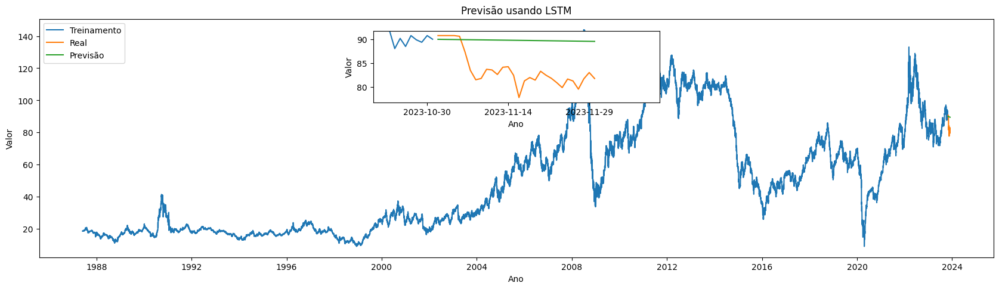

In [76]:
fig = plt.figure(figsize=(16, 4))
eixo = fig.add_axes([0, 0, 1, 1])
eixo.plot(train.index, train_data, label='Treinamento')
eixo.plot(test.index, test_data, label='Real')
eixo.plot(test.index, forecast_lstm, label='Previsão')
eixo.legend()
eixo.set_title('Previsão usando LSTM')
eixo.set_xlabel('Ano')
eixo.set_ylabel('Valor')
eixo2 = fig.add_axes([0.35, 0.65, 0.3, 0.3])
eixo2.plot(train.index, train_data)
eixo2.plot(test.index, test_data, label='Real') 
eixo2.plot(test.index, forecast_lstm, label='Previsão')
eixo2.set_xlim(pd.Timestamp('2023-10-20'), pd.Timestamp('2023-12-12')) # type: ignore
eixo2.set_ylim(min(min(test_data), min(forecast_lstm)) - 1, max(max(test_data), max(forecast_lstm)) + 1) # type: ignore
eixo2.set_xlabel('Ano')
eixo2.set_ylabel('Valor')
eixo2.xaxis.set_major_locator(plt.MaxNLocator(5)) # type: ignore
plt.show()

In [86]:
def plot_error(df, erro, label, title):
    df_sorted = df.sort_values(by=erro, ascending=True)
    num_models = len(df_sorted)
    custom_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
                            '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#aec7e8', '#ffbb78',
                            '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#c7c7c7',
                            '#dbdb8d', '#9edae5', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896',
                            '#c5b0d5', '#c49c94', '#f7b6d2', '#c7c7c7']

    color_scale = custom_color_palette[:num_models][::-1]
    fig = px.bar(df_sorted, y=erro, x='model',
                labels={erro: label, 'model': 'Modelo'},
                title=title,
                text=df_sorted[erro].apply(lambda x: f'{x:.4%}'),
                color=df_sorted['model'],
                color_discrete_sequence=color_scale)
    fig.update_layout(
        yaxis_tickformat=".0%",
        yaxis_title=label,
        xaxis_title="Modelo",
        xaxis_categoryorder='total ascending',
        margin=dict(l=0, r=0, t=50, b=0),
        showlegend=False
    )
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    fig.update_xaxes(showgrid=False)
    fig.update_layout(
        width=1100,
        height=400
    )
    return fig

In [87]:
model_names = [
    'SeasESOpt',
    'CES',
    'AutoTheta',
    'DynamicOptimizedTheta',
    'MSTL',
    'SeasWA'
]

wmape_train = [
    wmape_error(SeasESOpt_forecast['y'].values, SeasESOpt_forecast['SeasESOpt'].values),
    wmape_error(CES_forecast['y'].values, CES_forecast['CES'].values),
    wmape_error(AutoTheta_forecast['y'].values, AutoTheta_forecast['AutoTheta'].values),
    wmape_error(Dynamic_forecast['y'].values, Dynamic_forecast['DynamicOptimizedTheta'].values),
    wmape_error(MSTL_forecast['y'].values, MSTL_forecast['MSTL'].values),
    wmape_error(SeasWA_forecast['y'].values, SeasWA_forecast['SeasWA'].values)
]
wmape_valid = [
    wmape_error(SeasESOpt_forecast_valid['y'].values, SeasESOpt_forecast_valid['SeasESOpt'].values),
    wmape_error(CES_forecast_valid['y'].values, CES_forecast_valid['CES'].values),
    wmape_error(AutoTheta_forecast_valid['y'].values, AutoTheta_forecast_valid['AutoTheta'].values),
    wmape_error(Dynamic_forecast_valid['y'].values, Dynamic_forecast_valid['DynamicOptimizedTheta'].values),
    wmape_error(MSTL_forecast_valid['y'].values, MSTL_forecast_valid['MSTL'].values),
    wmape_error(SeasWA_forecast_valid['y'].values, SeasWA_forecast_valid['SeasWA'].values)
]
df_error = pd.DataFrame({'model': model_names, 'wmape_traino': wmape_train, 'wmape_validacao': wmape_valid})
df_error.to_parquet('error.parquet', index=False)

WMAPE (Weighted Mean Absolute Percentage Error): 3.02%
WMAPE (Weighted Mean Absolute Percentage Error): 6.84%
WMAPE (Weighted Mean Absolute Percentage Error): 6.56%
WMAPE (Weighted Mean Absolute Percentage Error): 6.56%
WMAPE (Weighted Mean Absolute Percentage Error): 3.15%
WMAPE (Weighted Mean Absolute Percentage Error): 9.57%
WMAPE (Weighted Mean Absolute Percentage Error): 4.47%
WMAPE (Weighted Mean Absolute Percentage Error): 12.10%
WMAPE (Weighted Mean Absolute Percentage Error): 11.06%
WMAPE (Weighted Mean Absolute Percentage Error): 11.06%
WMAPE (Weighted Mean Absolute Percentage Error): 2.57%
WMAPE (Weighted Mean Absolute Percentage Error): 3.01%


In [88]:
df_error = pd.read_parquet('error.parquet')
fig = plot_error(df_error, 'wmape_traino', 'wMAPE', 'wMAPE (Weighted Mean Absolute Percentage Error) Dados Treino')
fig.show()

In [89]:
fig = plot_error(df_error, 'wmape_validacao', 'wMAPE', 'wMAPE (Weighted Mean Absolute Percentage Error) Dados Validação')
fig.show()